In [1]:
import scanpy as sc
import pandas as pd
import infercnvpy as cnv
import numpy as np 

import sys
import os 
sys.path.append('/home/augusta/storage3/augusta/insituCNV/InSituCNV')
import insitucnv as icv

/home/augusta/anaconda3/envs/insitucnv_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# CosMx CNV inference

## Read in dataset

In [2]:
adata = sc.read('/home/augusta/storage3/augusta/insituCNV/data/WTx-CosMx_TVA/round2/221/adata_221_processed_1.h5ad')

In [3]:
# Subset to only contain the common genes across snPATHO-seq and CosMx for comparison
common_genes_df = pd.read_csv("221_common_genes.csv")
common_genes_df.head()

adata = adata[:, adata.var_names.isin(common_genes_df['common_genes'])].copy()

In [4]:
adata

AnnData object with n_obs × n_vars = 347023 × 14044
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'Dash', 'ISH.concentration', 'Panel', 'Run_Tissue_name', 'Run_name', 'assay_type', 'dualfiles', 'tissue', 'version', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'median_RNA', 'RNA_quantile_0.75', 'RNA_quantile_0.8', 'RNA_quantile_0.85', 'RNA_quantile_0.9', 'RNA_quantile_0.95', 'RNA_quantile_0.99', 'nCount_RNA', 'nFeature_RNA', 'median_negprobes', 'negprobes_quantile_0.75', 'negprobes_quantile_0.8', 'negprobes_quantile_0.85', 'negprobes_quantile_0.9', 'negprobes_quantile_0.95', 'negprobes_quantile_0.99', 'nCount_negprobes', 'nFeature_negprobes', 'median_falsecode', 'falsecode_quantile_0.75', 'falsecode_quantile_0.8', 'falsecode_quantil

In [5]:
adata.obs.add_sub.head()

c_2_1_2    epi
c_2_1_5    epi
c_2_1_7    epi
c_2_1_8    epi
c_2_1_9    epi
Name: add_sub, dtype: category
Categories (3, object): ['epi', 'imm', 'str']

## Run smoothing, CNV inference and epithelial clustering

In [6]:
# Compute the 200 nearest neighbors based on the PCA computation done in '1_prepare'
sc.pp.neighbors(adata, n_neighbors=100)

In [8]:
# Normalize the raw counts
adata.X = adata.layers['raw'].copy()
sc.pp.normalize_total(adata, target_sum = 1e4)

# Apply smoothing on 200 nearest neighbors
adata.layers['raw'] = adata.X.copy()
icv.tl.smooth_data_for_cnv(adata, n_neighbors=100)

# Normalize and log-transform the smoothed data
adata.X = adata.layers['M'].copy()
sc.pp.normalize_total(adata, target_sum = 1e4)
sc.pp.log1p(adata)

# Compute CNV inference using the REF region of interest as reference and with a window-size of 100
cnv.tl.infercnv(adata, 
                window_size =100,
                reference_key = 'ROI_status',
                reference_cat = ['REF'],
                chunksize = 1000)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 348/348 [01:42<00:00,  3.40it/s]


In [9]:
adata

AnnData object with n_obs × n_vars = 347023 × 14044
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'Dash', 'ISH.concentration', 'Panel', 'Run_Tissue_name', 'Run_name', 'assay_type', 'dualfiles', 'tissue', 'version', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'median_RNA', 'RNA_quantile_0.75', 'RNA_quantile_0.8', 'RNA_quantile_0.85', 'RNA_quantile_0.9', 'RNA_quantile_0.95', 'RNA_quantile_0.99', 'nCount_RNA', 'nFeature_RNA', 'median_negprobes', 'negprobes_quantile_0.75', 'negprobes_quantile_0.8', 'negprobes_quantile_0.85', 'negprobes_quantile_0.9', 'negprobes_quantile_0.95', 'negprobes_quantile_0.99', 'nCount_negprobes', 'nFeature_negprobes', 'median_falsecode', 'falsecode_quantile_0.75', 'falsecode_quantile_0.8', 'falsecode_quantil

In [ ]:
# Select only the epithelial cells and compute dimentionality reduction and nearest neighbor graph based on their CNV profiles
adata_epi = adata[adata.obs.add_sub == 'epi'].copy()
cnv.tl.pca(adata_epi)
cnv.pp.neighbors(adata_epi)

leiden res 0.1
heatmap
categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


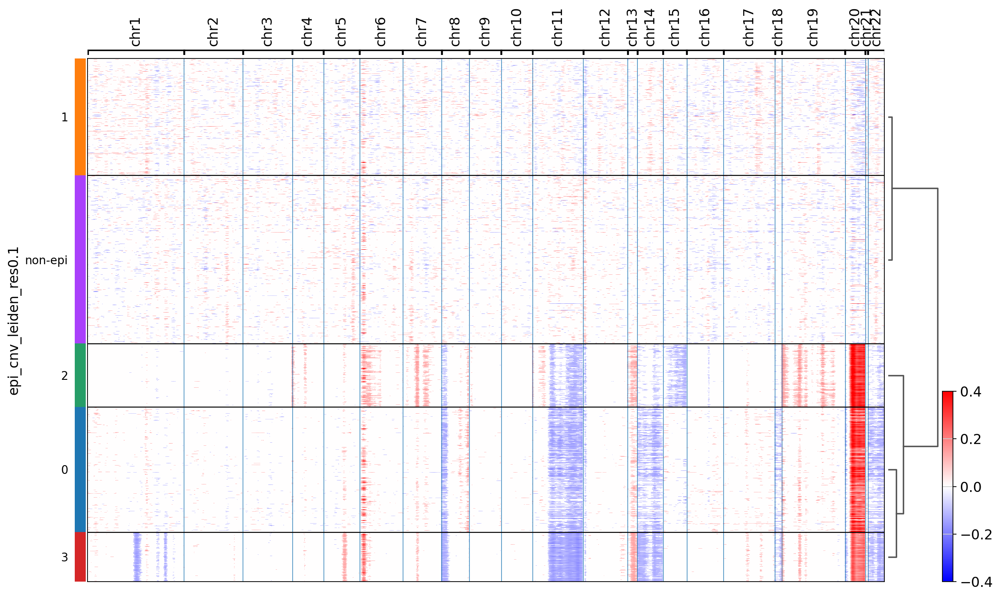

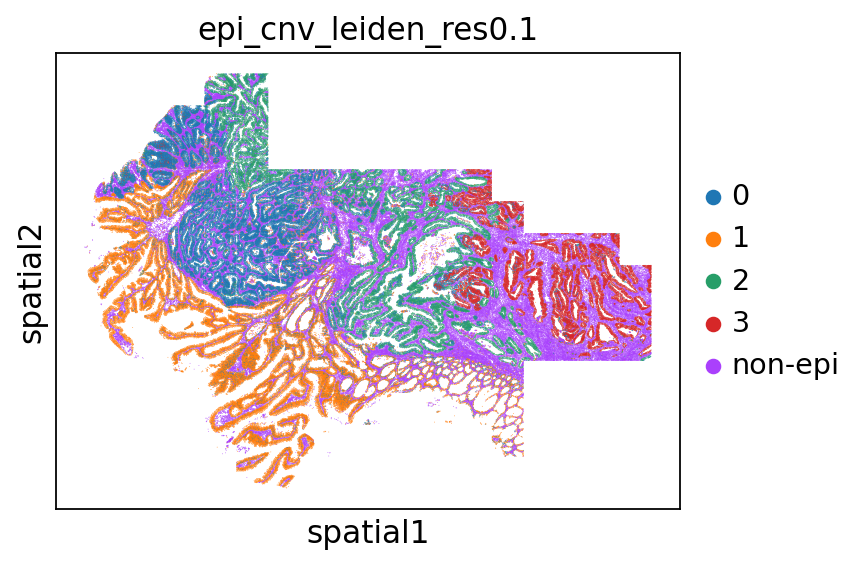

leiden res 0.2
heatmap
categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


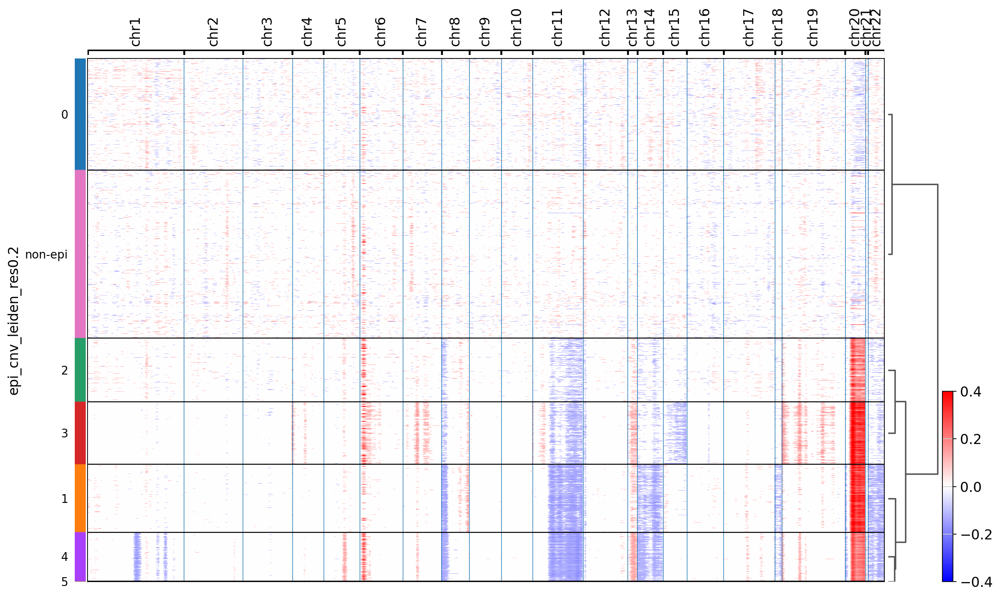

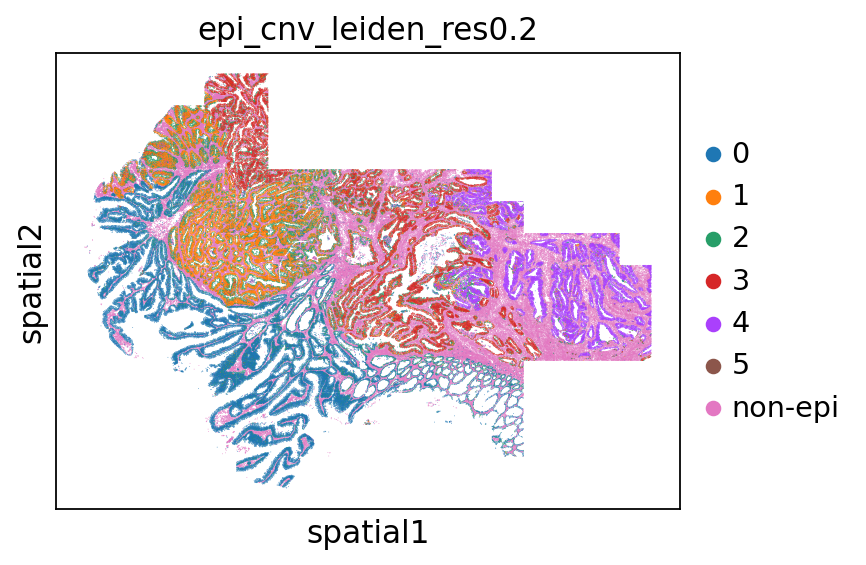

leiden res 0.3
heatmap
categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


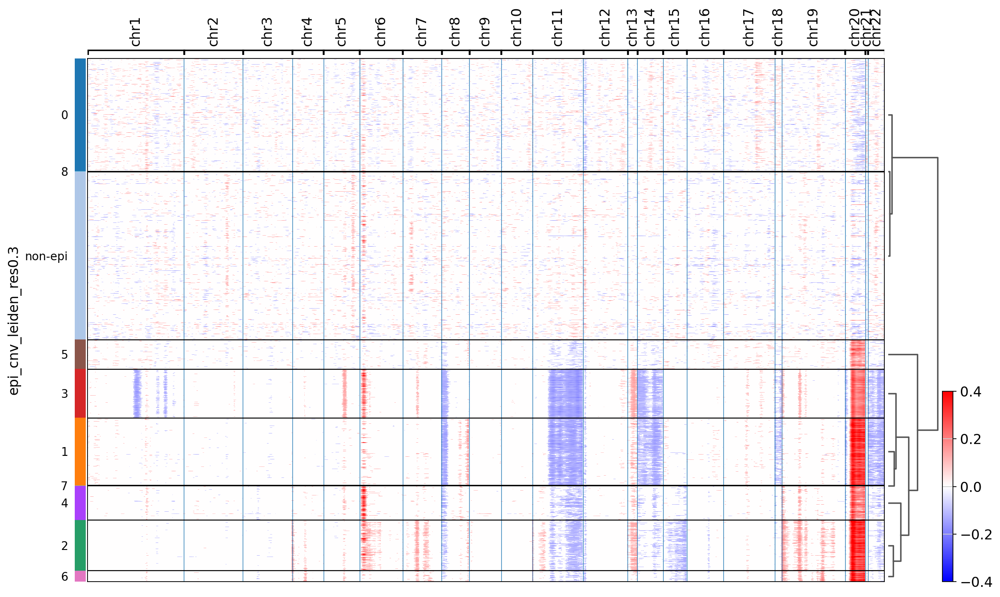

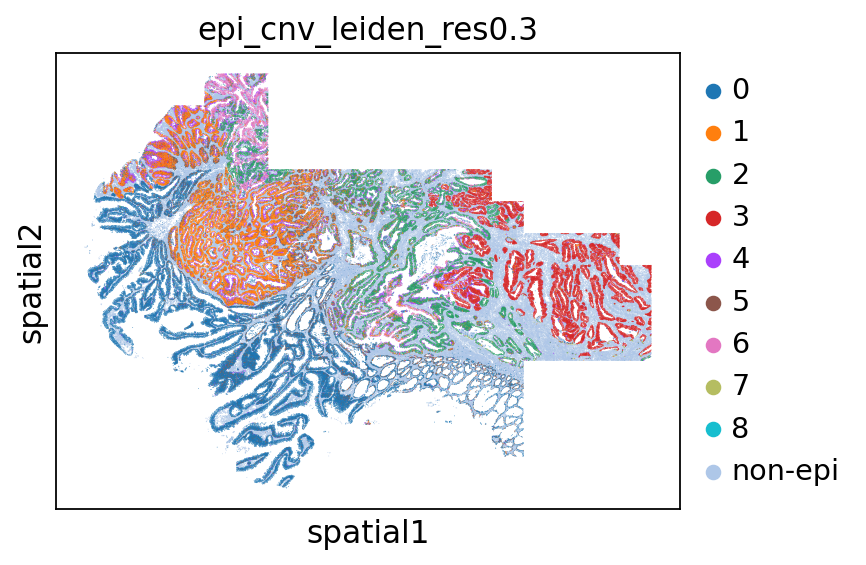

In [12]:
# Testing different resolutions
resolutions=[0.1, 0.2, 0.3]
    
for res in resolutions:

    # Cluster only the epithelial cells
    print('leiden res', res)
    key_added=f'epi_cnv_leiden_res{res}'
    #cnv.tl.leiden(adata_epi, resolution = res, key_added=key_added)

    # Add the epithelial clustering back to the whole CosMx dataset
    #adata.obs[key_added] = "non-epi"
    #adata.obs.loc[adata_epi.obs_names, key_added] = adata_epi.obs[key_added]

    # Plot CNV heatmap with dentrogram and vmin and vmax for comparison.
    print('heatmap')
    save_heatmap = f"_CosMx_221_common_n_200_groupby-{key_added}.pdf"
    cnv.pl.chromosome_heatmap(adata, groupby=key_added, dendrogram=True, save=save_heatmap, vmin=-.4, vmax=0.4) 

    sc.pl.spatial(adata, color=key_added, spot_size=100)

In [17]:
# For UMAP illustrations and CNV scores
cnv.tl.pca(adata)
cnv.pp.neighbors(adata)
cnv.tl.umap(adata)

resolutions = [0.1, 0.2, 0.3]

for res in resolutions:
    groupby=f'epi_cnv_leiden_res{res}'
    key_added=f'epi_cnv_score_res{res}'
    cnv.tl.cnv_score(adata, groupby=groupby, key_added=key_added)

## Save new adata object with CNV information

In [21]:
adata.write("/home/augusta/storage3/augusta/insituCNV/InSituCNV/Colorectal_cancer_CosMxWTx/01_insituCNV/data/CosMx_221_common_CNVinf.h5ad", compression = 'gzip')

In [23]:
adata

AnnData object with n_obs × n_vars = 347023 × 14044
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'Dash', 'ISH.concentration', 'Panel', 'Run_Tissue_name', 'Run_name', 'assay_type', 'dualfiles', 'tissue', 'version', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'median_RNA', 'RNA_quantile_0.75', 'RNA_quantile_0.8', 'RNA_quantile_0.85', 'RNA_quantile_0.9', 'RNA_quantile_0.95', 'RNA_quantile_0.99', 'nCount_RNA', 'nFeature_RNA', 'median_negprobes', 'negprobes_quantile_0.75', 'negprobes_quantile_0.8', 'negprobes_quantile_0.85', 'negprobes_quantile_0.9', 'negprobes_quantile_0.95', 'negprobes_quantile_0.99', 'nCount_negprobes', 'nFeature_negprobes', 'median_falsecode', 'falsecode_quantile_0.75', 'falsecode_quantile_0.8', 'falsecode_quantil

## Plot and save heatmap figure

In [15]:
adata.uns['epi_cnv_leiden_res0.1_colors'] = ['#FFCD4E',#gul 0
                                             '#677DB7', #blå 1
                                             '#FF773D', #orange 2
                                             '#9B1D20',#röd
                                             '#ada9b0',#grå non-epi
                                            ]

categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


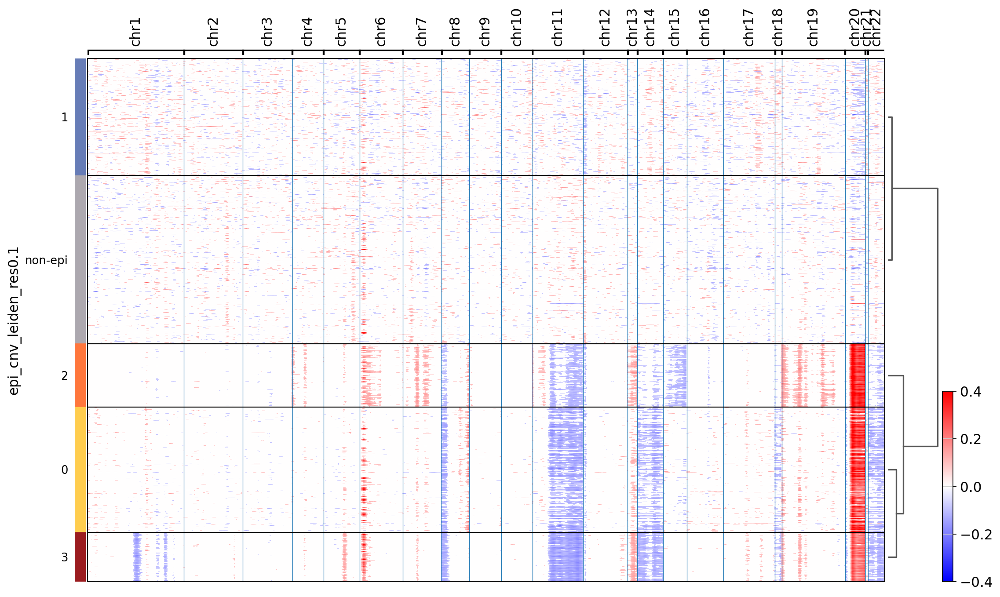

In [19]:
sid ='221'
groupby='epi_cnv_leiden_res0.1'
save_heatmap = f"_CosMx_221_common_fig_groupby-{groupby}.pdf"
# save_heatmap = None
cnv.pl.chromosome_heatmap(adata, groupby=groupby, dendrogram=True, save=save_heatmap, vmin=-.4, vmax=0.4)

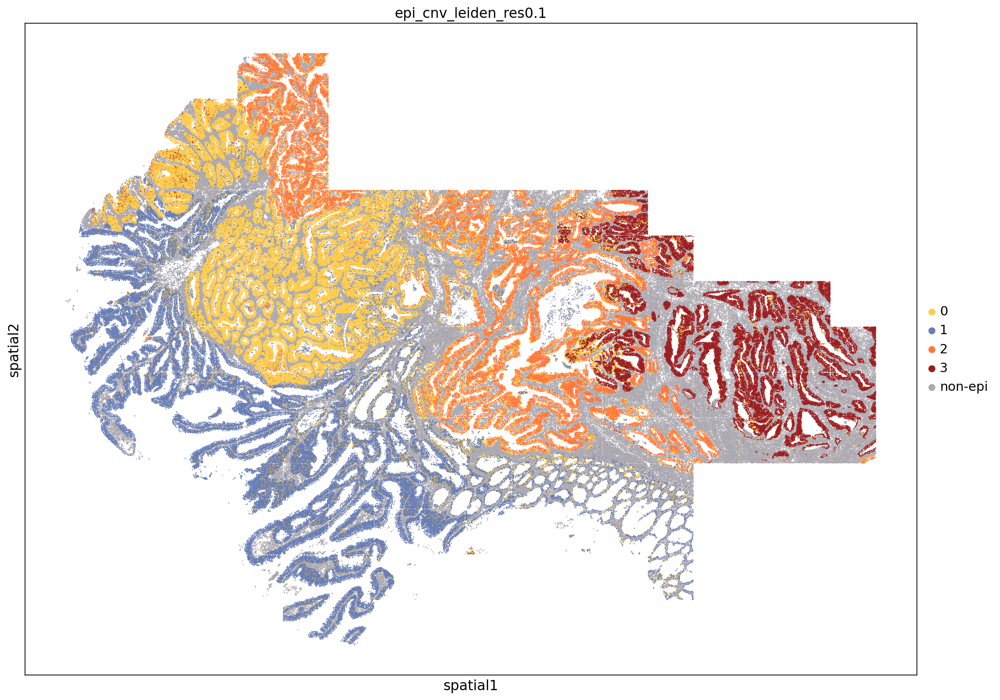

In [18]:
# Set default figure size globally for matplotlib (width, height in inches)
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (16, 16)  # Adjust as needed

key_added = 'epi_cnv_leiden_res0.1'
sc.pl.spatial(adata, color=key_added, spot_size=100, save=f"_CosMx_221_common_n_100_groupby-{key_added}.pdf")

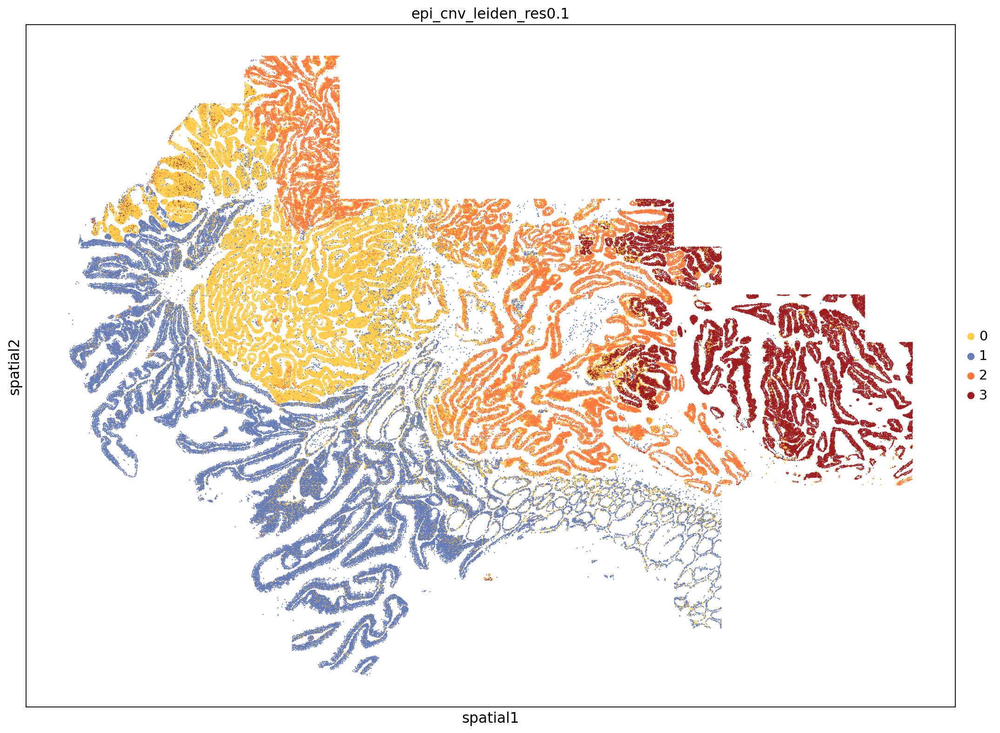

In [20]:
sc.pl.spatial(adata[adata.obs[key_added].isin(['0','1','2','3'])], color=key_added, spot_size=100, save=f"_CosMx_221_onlyepi_common_n_100_groupby-{key_added}.pdf")

In [25]:
adata

AnnData object with n_obs × n_vars = 347023 × 14044
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68_CK8_18', 'Max.CD68_CK8_18', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'Dash', 'ISH.concentration', 'Panel', 'Run_Tissue_name', 'Run_name', 'assay_type', 'dualfiles', 'tissue', 'version', 'slide_ID', 'CenterX_global_px', 'CenterY_global_px', 'cell_ID', 'unassignedTranscripts', 'median_RNA', 'RNA_quantile_0.75', 'RNA_quantile_0.8', 'RNA_quantile_0.85', 'RNA_quantile_0.9', 'RNA_quantile_0.95', 'RNA_quantile_0.99', 'nCount_RNA', 'nFeature_RNA', 'median_negprobes', 'negprobes_quantile_0.75', 'negprobes_quantile_0.8', 'negprobes_quantile_0.85', 'negprobes_quantile_0.9', 'negprobes_quantile_0.95', 'negprobes_quantile_0.99', 'nCount_negprobes', 'nFeature_negprobes', 'median_falsecode', 'falsecode_quantile_0.75', 'falsecode_quantile_0.8', 'falsecode_quantil

In [28]:
adata.uns['ROI_status_colors'] 

['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc']

In [29]:
adata.uns['ROI_status_colors'] = ['#B6244F',#CRC
                                '#285943', #REF
                                '#E8C140', #TVA1
                                '#9E6726',#2
                                '#E59308',#3
                                ]

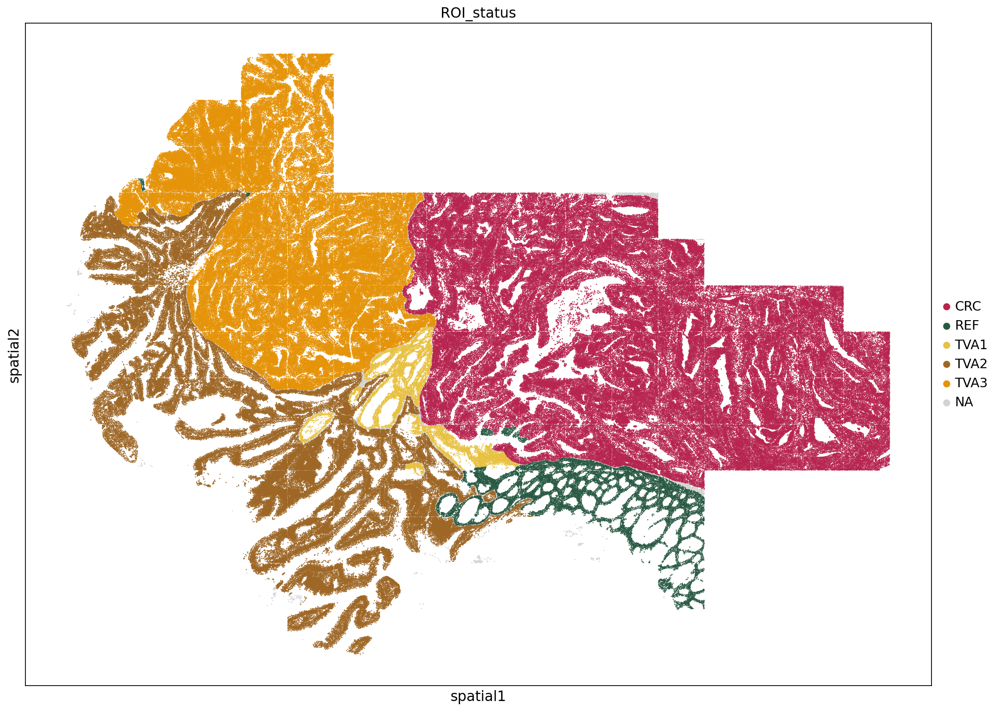

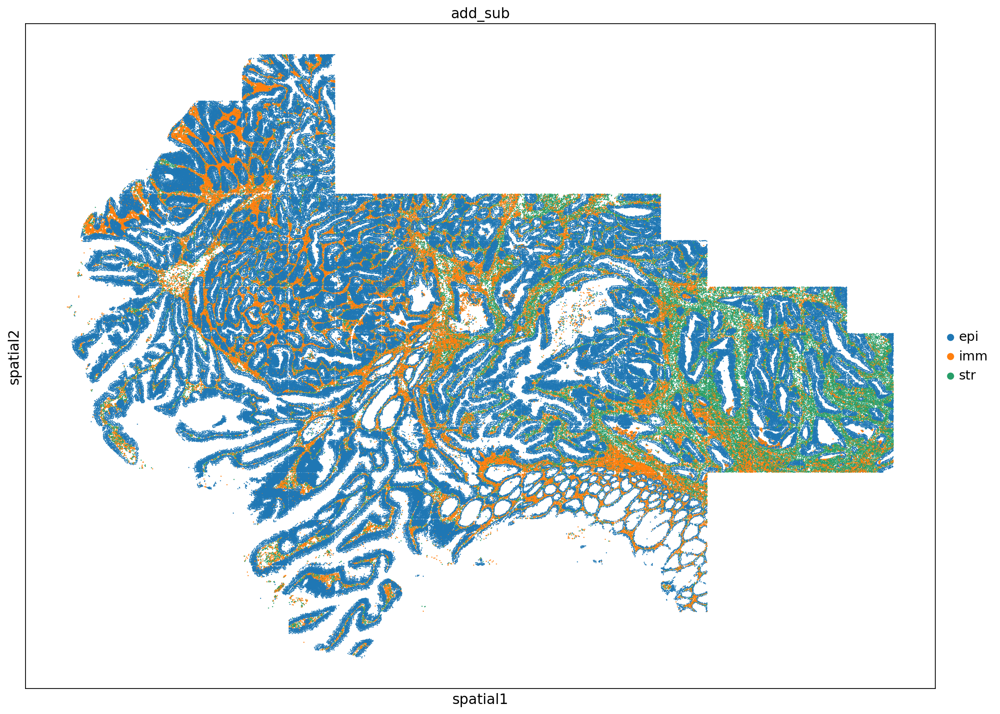

In [30]:
for key in ['ROI_status','add_sub']:
    sc.pl.spatial(adata, color=key, spot_size=100, save=f"_CosMx_221_common_n_100_groupby-{key}.pdf")